In [3]:
%matplotlib inline
from IPython.display import Image, HTML
import json
import datetime
import ast
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
from scipy import stats
from collections import Counter
from wordcloud import WordCloud, STOPWORDS
import warnings
warnings.filterwarnings('ignore')

In [1]:
!pip install wordcloud

ERROR: Could not install packages due to an OSError: [WinError 2] The system cannot find the file specified: 'C:\\Python310\\Scripts\\f2py.exe' -> 'C:\\Python310\\Scripts\\f2py.exe.deleteme'



     ------------------------------------ 153.1/153.1 KB 607.7 kB/s eta 0:00:00
     ---------------------------------------- 14.6/14.6 MB 1.0 MB/s eta 0:00:00
     ---------------------------------------- 7.2/7.2 MB 954.6 kB/s eta 0:00:00
  Using cached Pillow-9.2.0-cp310-cp310-win_amd64.whl (3.3 MB)
  Using cached packaging-21.3-py3-none-any.whl (40 kB)
  Using cached cycler-0.11.0-py3-none-any.whl (6.4 kB)
     -------------------------------------- 55.3/55.3 KB 577.2 kB/s eta 0:00:00
  Using cached python_dateutil-2.8.2-py2.py3-none-any.whl (247 kB)
     ------------------------------------ 164.1/164.1 KB 545.8 kB/s eta 0:00:00
     ------------------------------------ 960.8/960.8 KB 647.1 kB/s eta 0:00:00



You should consider upgrading via the 'C:\Python310\python.exe -m pip install --upgrade pip' command.


In [4]:
df = pd.read_csv('movies.csv')

df.head()

,Unnamed: 0,Unnamed: 0.1,budget,genres,id,imdb_id,original_language,overview,popularity,poster_path,...,title,vote_average,vote_count,cast,crew,movieId,keywords,release_year,imdbid,features
0,0,0,30000000,Animation Comedy Family,862,114709,English,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,...,Toy Story,7.7,5415.0,TomHanks TimAllen DonRickles,JohnLasseter,1,jealousy toy boy friendship friends rivalry bo...,1995,tt0114709,"led by woody, andy's toys live happily in his ..."
1,1,1,65000000,Adventure Fantasy Family,8844,113497,English,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,...,Jumanji,6.9,2413.0,RobinWilliams JonathanHyde KirstenDunst,JoeJohnston,2,boardgame disappearance basedonchildren'sbook ...,1995,tt0113497,when siblings judy and peter discover an encha...
2,2,2,0,Romance Comedy,15602,113228,English,A family wedding reignites the ancient feud be...,11.712900,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,...,Grumpier Old Men,6.5,92.0,WalterMatthau JackLemmon Ann-Margret,HowardDeutch,3,fishing bestfriend duringcreditsstinger oldmen,1995,tt0113228,a family wedding reignites the ancient feud be...
3,3,3,16000000,Comedy Drama Romance,31357,114885,English,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,...,Waiting to Exhale,6.1,34.0,WhitneyHouston AngelaBassett LorettaDevine,ForestWhitaker,4,basedonnovel interracialrelationship singlemot...,1995,tt0114885,"cheated on, mistreated and stepped on, the wom..."
4,4,4,0,Comedy,11862,113041,English,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,...,Father of the Bride Part II,5.7,173.0,SteveMartin DianeKeaton MartinShort,CharlesShyer,5,baby midlifecrisis confidence aging daughter m...,1995,tt0113041,just when george banks has recovered from his ...


In [5]:
df = df.drop('Unnamed: 0.1', axis = 1)

In [6]:
df = df.drop('Unnamed: 0', axis = 1)

In [7]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [8]:
df.shape

(30693, 24)

In [9]:
df = df[['id', 'title', 'genres', 'overview', 'cast', 'crew', 'production_companies', 'production_countries', 'keywords', 
         'features', 'original_language', 'imdb_id', 'popularity', 'release_date', 'revenue', 'tagline', 'vote_average', 'vote_count', 'imdbid', 'features', 'poster_path', 'runtime', 'movieId', 'budget']]

df.head()

,id,title,genres,overview,cast,crew,production_companies,production_countries,keywords,features,original_language,imdb_id,popularity,release_date,revenue,tagline,vote_average,vote_count,imdbid,features,poster_path,runtime,movieId,budget
0,862,Toy Story,Animation Comedy Family,"Led by Woody, Andy's toys live happily in his ...",TomHanks TimAllen DonRickles,JohnLasseter,Pixar Animation Studios,United States of America,jealousy toy boy friendship friends rivalry bo...,"led by woody, andy's toys live happily in his ...",English,114709,21.946943,1995-10-30,373554033.0,NaN,7.7,5415.0,tt0114709,"led by woody, andy's toys live happily in his ...",/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,81.0,1,30000000
1,8844,Jumanji,Adventure Fantasy Family,When siblings Judy and Peter discover an encha...,RobinWilliams JonathanHyde KirstenDunst,JoeJohnston,TriStar Pictures Teitler Film Interscope Commu...,United States of America,boardgame disappearance basedonchildren'sbook ...,when siblings judy and peter discover an encha...,English,113497,17.015539,1995-12-15,262797249.0,Roll the dice and unleash the excitement!,6.9,2413.0,tt0113497,when siblings judy and peter discover an encha...,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,104.0,2,65000000
2,15602,Grumpier Old Men,Romance Comedy,A family wedding reignites the ancient feud be...,WalterMatthau JackLemmon Ann-Margret,HowardDeutch,Warner Bros. Lancaster Gate,United States of America,fishing bestfriend duringcreditsstinger oldmen,a family wedding reignites the ancient feud be...,English,113228,11.712900,1995-12-22,0.0,Still Yelling. Still Fighting. Still Ready for...,6.5,92.0,tt0113228,a family wedding reignites the ancient feud be...,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,101.0,3,0
3,31357,Waiting to Exhale,Comedy Drama Romance,"Cheated on, mistreated and stepped on, the wom...",WhitneyHouston AngelaBassett LorettaDevine,ForestWhitaker,Twentieth Century Fox Film Corporation,United States of America,basedonnovel interracialrelationship singlemot...,"cheated on, mistreated and stepped on, the wom...",English,114885,3.859495,1995-12-22,81452156.0,Friends are the people who let you be yourself...,6.1,34.0,tt0114885,"cheated on, mistreated and stepped on, the wom...",/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,127.0,4,16000000
4,11862,Father of the Bride Part II,Comedy,Just when George Banks has recovered from his ...,SteveMartin DianeKeaton MartinShort,CharlesShyer,Sandollar Productions Touchstone Pictures,United States of America,baby midlifecrisis confidence aging daughter m...,just when george banks has recovered from his ...,English,113041,8.387519,1995-10-02,76578911.0,Just When His World Is Back To Normal... He's ...,5.7,173.0,tt0113041,just when george banks has recovered from his ...,/e64sOI48hQXyru7naBFyssKFxVd.jpg,106.0,5,0


In [10]:
df.describe()

,id,imdb_id,popularity,revenue,vote_average,vote_count,runtime,movieId,budget
count,30693.000000,30693.00000,30693.000000,3.069300e+04,30693.00000,30693.000000,30693.000000,30693.000000,3.069300e+04
mean,65702.706220,195427.53970,2.747661,1.066723e+07,5.62915,96.352719,99.886358,79075.983775,4.132846e+06
std,71480.746245,212860.22336,4.598565,5.847861e+07,1.90286,444.993505,33.199076,59650.281782,1.640613e+07
min,2.000000,1.00000,0.000000,0.000000e+00,0.00000,0.000000,16.000000,1.000000,0.000000e+00
25%,17740.000000,64038.00000,0.364228,0.000000e+00,5.00000,3.000000,88.000000,7976.000000,0.000000e+00
50%,41809.000000,102070.00000,1.047417,0.000000e+00,6.00000,9.000000,95.000000,81853.000000,0.000000e+00
75%,84972.000000,274530.00000,3.493310,0.000000e+00,6.80000,30.000000,107.000000,134198.000000,0.000000e+00
max,469172.000000,999913.00000,294.337037,2.787965e+09,10.00000,12269.000000,1256.000000,176275.000000,3.000000e+08


In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,30693.0,6.570271e+04,7.148075e+04,2.0,17740.000000,41809.000000,84972.00000,4.691720e+05
imdb_id,30693.0,1.954275e+05,2.128602e+05,1.0,64038.000000,102070.000000,274530.00000,9.999130e+05
popularity,30693.0,2.747661e+00,4.598565e+00,0.0,0.364228,1.047417,3.49331,2.943370e+02
revenue,30693.0,1.066723e+07,5.847861e+07,0.0,0.000000,0.000000,0.00000,2.787965e+09
vote_average,30693.0,5.629150e+00,1.902860e+00,0.0,5.000000,6.000000,6.80000,1.000000e+01
vote_count,30693.0,9.635272e+01,4.449935e+02,0.0,3.000000,9.000000,30.00000,1.226900e+04
runtime,30693.0,9.988636e+01,3.319908e+01,16.0,88.000000,95.000000,107.00000,1.256000e+03
movieId,30693.0,7.907598e+04,5.965028e+04,1.0,7976.000000,81853.000000,134198.00000,1.762750e+05
budget,30693.0,4.132846e+06,1.640613e+07,0.0,0.000000,0.000000,0.00000,3.000000e+08


In [12]:
df.duplicated().sum()

0

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30693 entries, 0 to 30692
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    30693 non-null  int64  
 1   title                 30693 non-null  object 
 2   genres                29113 non-null  object 
 3   overview              30248 non-null  object 
 4   cast                  29571 non-null  object 
 5   crew                  30302 non-null  object 
 6   production_companies  30693 non-null  object 
 7   production_countries  30693 non-null  object 
 8   keywords              22150 non-null  object 
 9   features              30693 non-null  object 
 10  original_language     30693 non-null  object 
 11  imdb_id               30693 non-null  int64  
 12  popularity            30693 non-null  float64
 13  release_date          30693 non-null  object 
 14  revenue               30693 non-null  float64
 15  tagline            

# Univariate Analysis - 

## Categorical Columns:

### 1. Geners

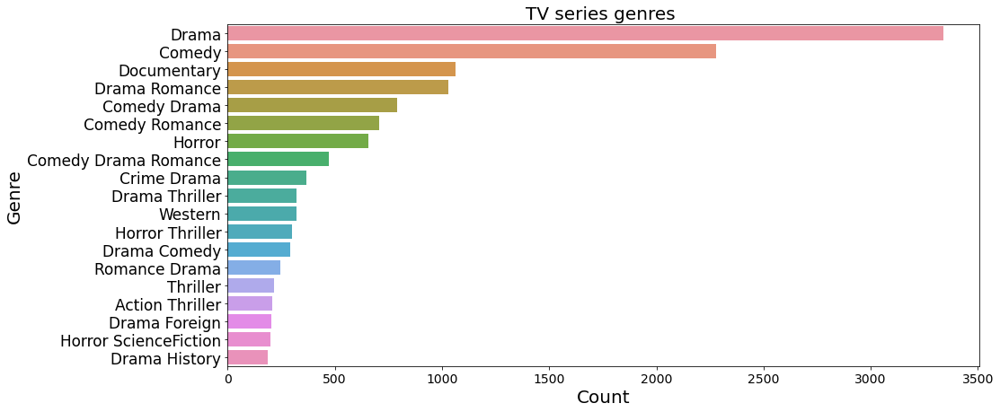

In [13]:
count = Counter(df["genres"])
count = count.most_common()[:20]
x, y = map(list,zip(*count))

plt.figure(figsize = (15,7))

g = sns.barplot(y,x)
g.set_ylabel("genres")


plt.title("TV series genres ",fontsize=20)

plt.ylabel("Genre",fontsize = 20)

plt.xlabel("Count",fontsize = 20)


plt.xticks(fontsize = 14)
plt.yticks(fontsize = 17)



plt.show()

## Obsevation - As per the above count plot it seems there is highest no.of TV series gener are Drama as compared to the other TV series.

### 2. Languages of the TV series

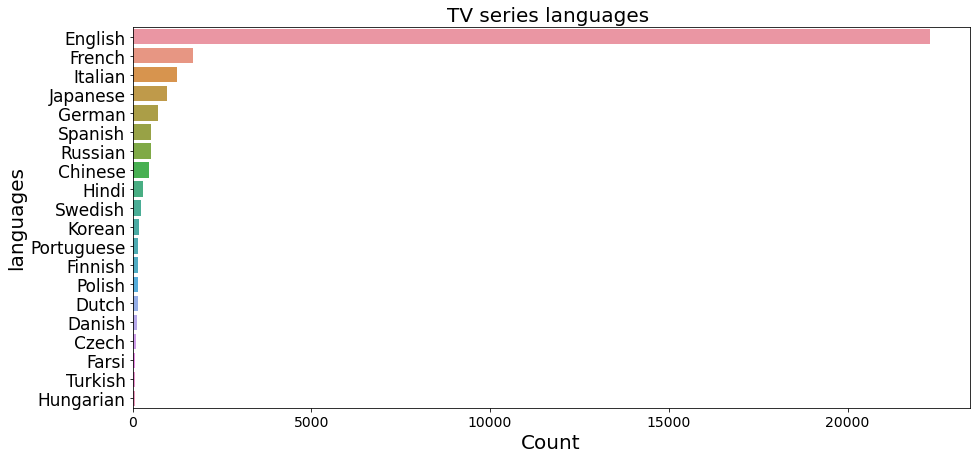

In [42]:
count = Counter(df["original_language"])
count = count.most_common()[:20]
x, y = map(list,zip(*count))

plt.figure(figsize = (15,7))

g = sns.barplot(y,x)
g.set_ylabel("Languages")


plt.title("TV series languages ",fontsize=20)

plt.ylabel("languages",fontsize = 20)

plt.xlabel("Count",fontsize = 20)


plt.xticks(fontsize = 14)
plt.yticks(fontsize = 17)



plt.show()

## Obsevation - As per the above count plot of languages it seems there is highest no.of TV series are in English

### 3. TV series Cast

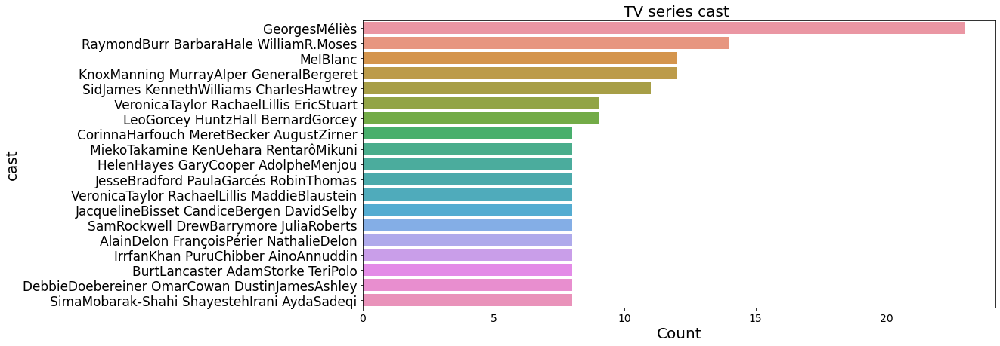

In [15]:
count = Counter(df["cast"])
count = count.most_common()[:20]
x, y = map(list,zip(*count))

plt.figure(figsize = (15,7))

g = sns.barplot(y,x)
g.set_ylabel("Language")


plt.title("TV series cast ",fontsize=20)

plt.ylabel("cast",fontsize = 20)

plt.xlabel("Count",fontsize = 20)


plt.xticks(fontsize = 14)
plt.yticks(fontsize = 17)



plt.show()

## Obsevation - As per the above count plot of cast it seems GeorgesMeeleis has acted in many TV series

### 4. TV series Crew

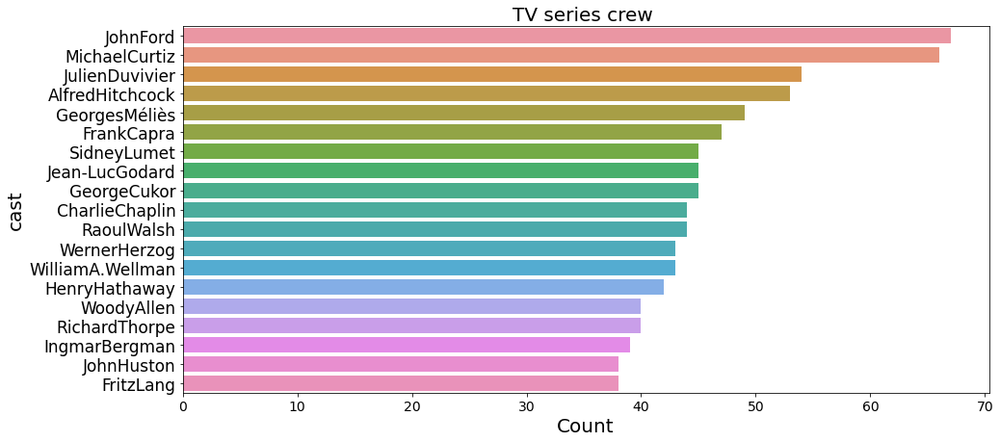

In [16]:
count = Counter(df["crew"])
count = count.most_common()[:20]
x, y = map(list,zip(*count))

plt.figure(figsize = (15,7))

g = sns.barplot(y,x)
g.set_ylabel("Crew")


plt.title("TV series crew ",fontsize=20)

plt.ylabel("cast",fontsize = 20)

plt.xlabel("Count",fontsize = 20)


plt.xticks(fontsize = 14)
plt.yticks(fontsize = 17)



plt.show()

## Obsevation - As per the above count plot of crew it seems JohnFord has directed many TV series

In [17]:
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

day_order = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

In [18]:
def get_month(x):
    try:
        return month_order[int(str(x).split('-')[1]) - 1]
    except:
        return np.nan

In [19]:
def get_day(x):
    try:
        year, month, day = (int(i) for i in x.split('-'))    
        answer = datetime.date(year, month, day).weekday()
        return day_order[answer]
    except:
        return np.nan

In [20]:
df['day'] = df['release_date'].apply(get_day)

df['month'] = df['release_date'].apply(get_month)

<AxesSubplot:title={'center':'Number of Movies released in a particular month.'}, xlabel='month', ylabel='count'>

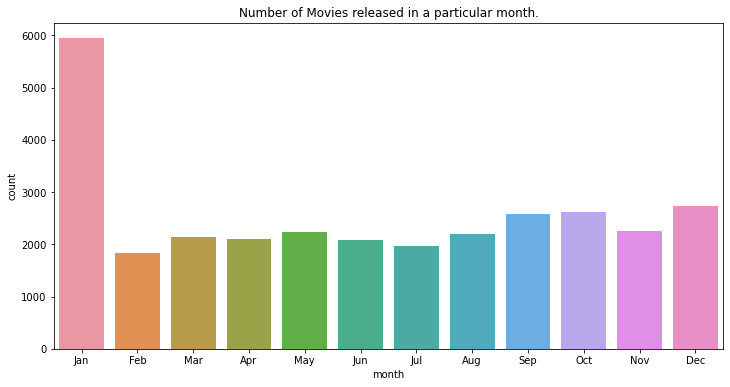

In [21]:
plt.figure(figsize = (12,6))

plt.title("Number of Movies released in a particular month.")

sns.countplot(x = 'month', data = df, order = month_order)

## Obseravtion - As per the above count plot of released date here it seems number of movies has released in month of January

<AxesSubplot:ylabel='production_countries'>

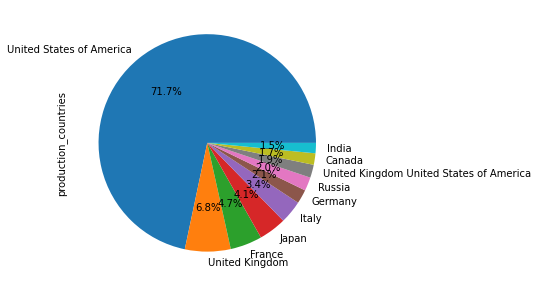

In [22]:
plt.figure(figsize=(5,5))

df['production_countries'].value_counts().head(10).plot( kind='pie', autopct='%1.1f%%')

## Obseravation - As per the pie plot it seems USA has high production rate of making TV series

## Word Cloud

In [23]:
df['title'] = df['title'].astype('str')
title_corpus = ' '.join(df['title'])

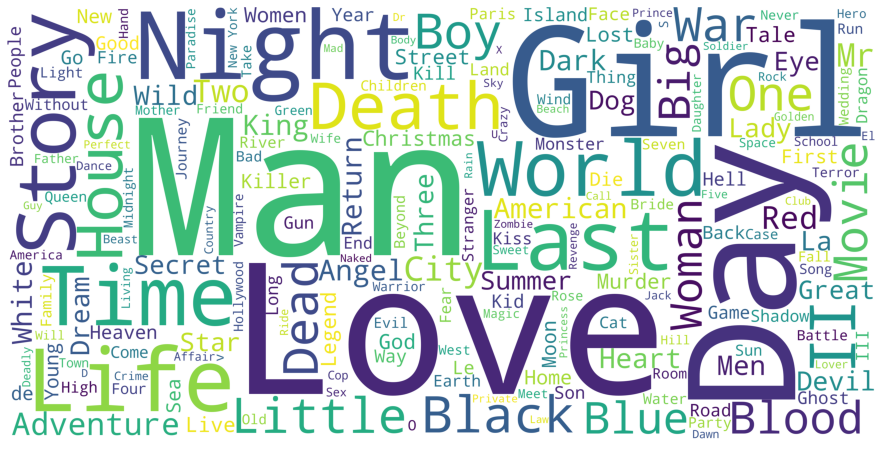

In [24]:
title_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', height=2000, width=4000).generate(title_corpus)
plt.figure(figsize=(16,8))
plt.imshow(title_wordcloud)
plt.axis('off')
plt.show()

In [25]:
df['overview'] = df['overview'].astype('str')
overview_corpus = ' '.join(df['overview'])

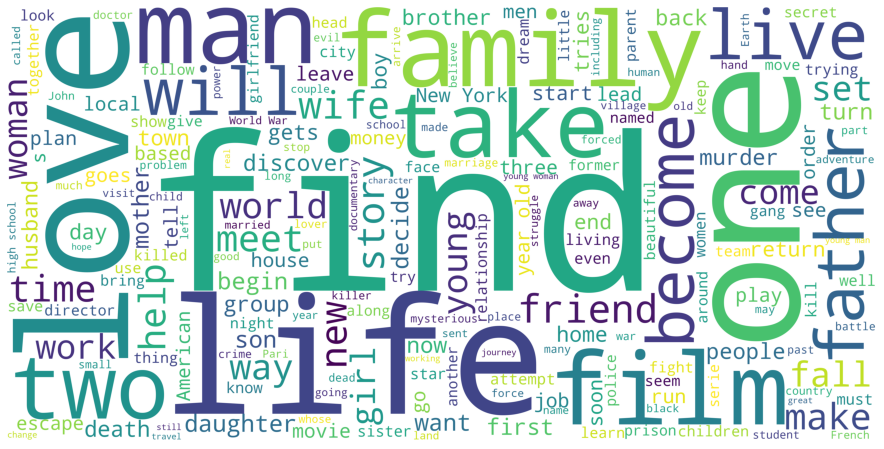

In [26]:
title_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', height=2000, width=4000).generate(overview_corpus)
plt.figure(figsize=(16,8))
plt.imshow(title_wordcloud)
plt.axis('off')
plt.show()

In [27]:
df['genres'] = df['genres'].astype('str')
genres_corpus = ' '.join(df['genres'])

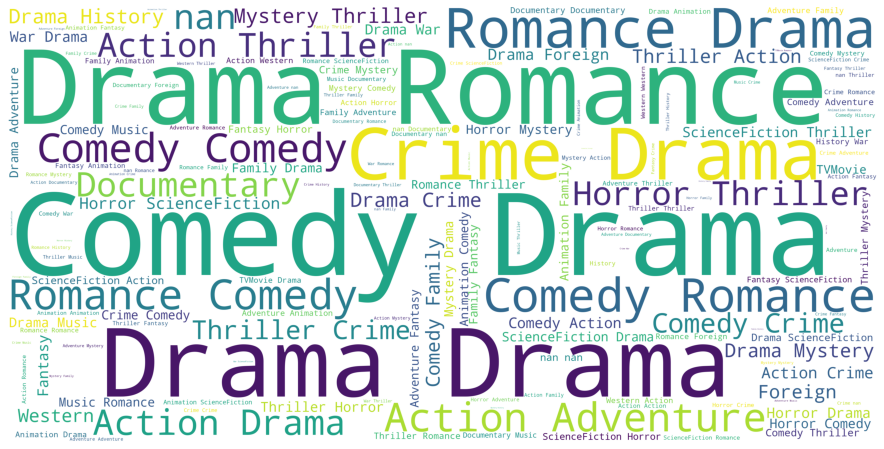

In [28]:
title_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', height=2000, width=4000).generate(genres_corpus)
plt.figure(figsize=(16,8))
plt.imshow(title_wordcloud)
plt.axis('off')
plt.show()

## All Nemericals Columns

In [29]:
numerical_cols = df.select_dtypes(include = np.number).columns.tolist()

print("Numerical Variables:")
print(numerical_cols)

Numerical Variables:
['id', 'imdb_id', 'popularity', 'revenue', 'vote_average', 'vote_count', 'runtime', 'movieId', 'budget']


## Histogram

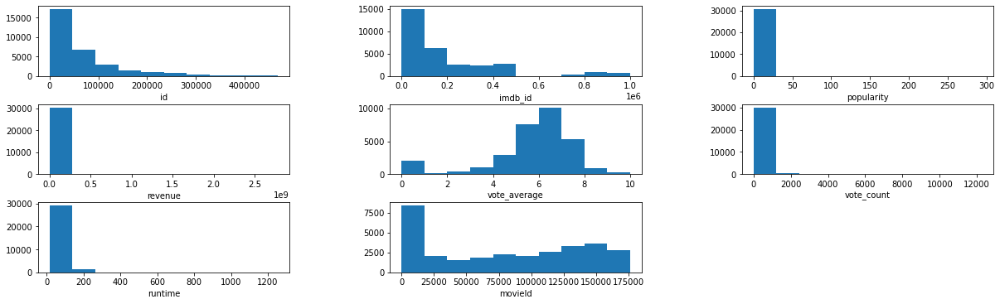

In [30]:
plt.figure(figsize = (20, 20))

for i, col in enumerate(numerical_cols[:-1]):
    plt.subplot(10, 3, i+1)
    plt.hist(df[col])
    plt.xlabel(col)
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.show()

## Distribution plot

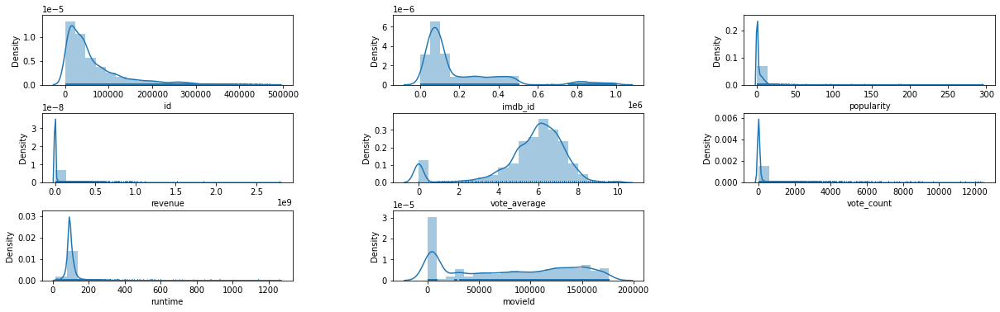

In [31]:
plt.figure(figsize = (20, 20))

for i, col in enumerate(numerical_cols[:-1]):
    plt.subplot(10, 3, i+1)
    sns.distplot(df[col], bins = 20, kde = True, rug = True)
    plt.xlabel(col)
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.show()

## Box Plot

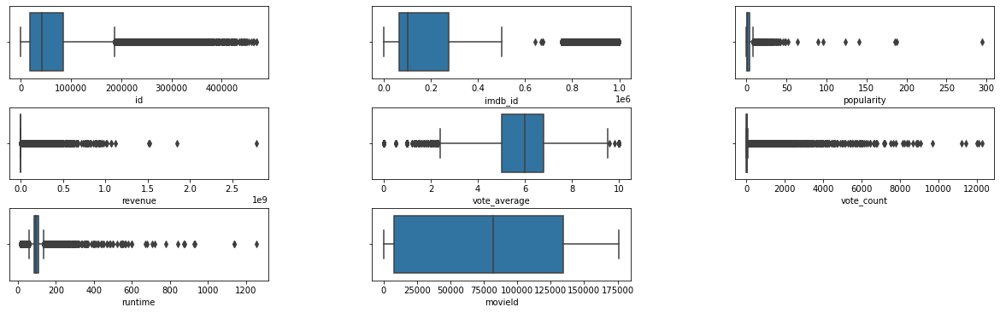

In [32]:
plt.figure(figsize = (20, 20))

for i, col in enumerate(numerical_cols[:-1]):
    plt.subplot(10, 3, i+1)
    sns.boxplot(df[col])
    plt.xlabel(col)
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.show()

## Conclusion - 

1. Very few TV series has generated the higher revenue as shown in the histogram.
2. The Vote average of the TV series between range 3 to 9 as shown in the bar plot. 
3. The Vote average column is normally distrubuted as shown in the distribution plot
4. The runtime column has right tail which means it is right skewed as per the distribution plot.

# Bivariate Analysis

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30693 entries, 0 to 30692
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    30693 non-null  int64  
 1   title                 30693 non-null  object 
 2   genres                30693 non-null  object 
 3   overview              30693 non-null  object 
 4   cast                  29571 non-null  object 
 5   crew                  30302 non-null  object 
 6   production_companies  30693 non-null  object 
 7   production_countries  30693 non-null  object 
 8   keywords              22150 non-null  object 
 9   features              30693 non-null  object 
 10  original_language     30693 non-null  object 
 11  imdb_id               30693 non-null  int64  
 12  popularity            30693 non-null  float64
 13  release_date          30693 non-null  object 
 14  revenue               30693 non-null  float64
 15  tagline            

ValueError: Could not interpret input 'month'

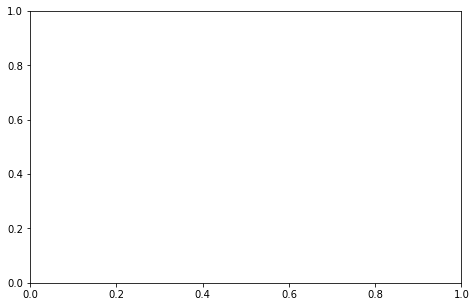

In [14]:
plt.figure(figsize = (17,5))

plt.subplot(1,2,1)

sns.barplot(data = df , x = 'month', y = 'revenue')

## Observation - As per the above sub plot we see highest revenue has generated in month of July

<AxesSubplot:xlabel='revenue', ylabel='production_countries'>

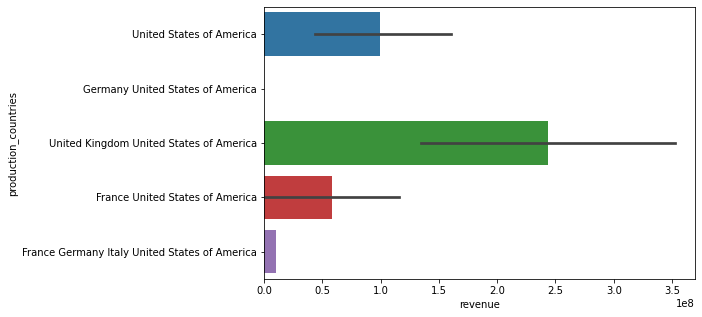

In [15]:
plt.figure(figsize = (17,5))

plt.subplot(1,2,1)

sns.barplot(data = df.head(20) , x = 'revenue', y = 'production_countries')

## Top 10 popular TV series

In [17]:
popular = df.sort_values('popularity', ascending=False).reset_index()[:10]

fig1 = px.bar(popular, popular['popularity'], popular['title'], title= 'Popular Movies', color='vote_average')
fig1.show()

## Observation - As per the above bar plot we can see Wonder Woman is very polpular TV series as popularity is at 7.2

### Profit

In [19]:
df['profit'] = df['revenue'] - df['budget']

df.profit.head()

0    343554033.0
1    197797249.0
2            0.0
3     65452156.0
4     76578911.0
Name: profit, dtype: float64

### Profit vs. Budget

In [20]:
scatter = px.scatter(df, df['budget'], df['profit'], title= 'Profit vs Budget', color='vote_average', size='revenue',  hover_data=['title'])

scatter

## Observation - As per the above scatter plot between profit and budget we can see the TV series which has generated highest profit is range between 200M to 250M

### Profit vs. Revenue

In [39]:
pr_re = px.scatter(df, df['revenue'], df['profit'], title= 'Profit vs revenue', color='vote_average', size='revenue',  hover_data=['title'])

pr_re

## Observation - As per the scatter plot between profit and revenue we can see the higher revenue the higher profit which is directly propotional to ecah other

## Multivariate Analysis

<AxesSubplot:xlabel='budget', ylabel='profit'>

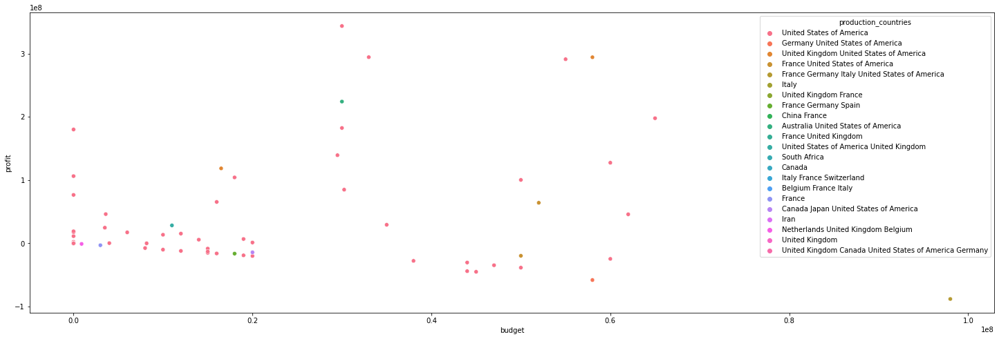

In [50]:
plt.figure(figsize=(25,8))

sns.scatterplot(df["budget"], df["profit"], hue = df["production_countries"].head(100))

<AxesSubplot:xlabel='revenue', ylabel='profit'>

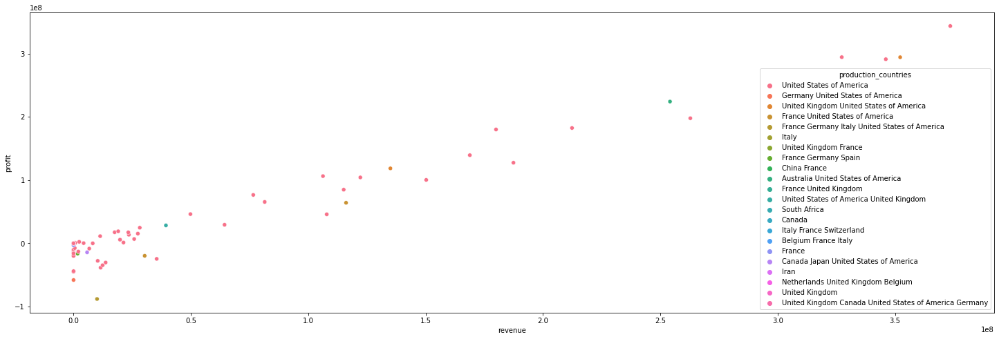

In [51]:
plt.figure(figsize=(25,8))

sns.scatterplot(df["revenue"], df["profit"], hue = df["production_countries"].head(100))

## Conclusion - 
1. United state of America has generated highest profit with low budget.
2. United state of America has highest revenue with highest profit.
3. United state of America has genreated highest profit of 2.5B.